In [2]:
import torch
import yaml
from utils.builder import ConfigBuilder
from models.autoencoder_kl_gan_model import autoencoder_kl_gan_model
from datasets.hmdb import HMDBFrame
from torch.utils.data import DataLoader
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt
from utils.logger import get_logger  

/home/exouser/anaconda3/envs/yuzhengood/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# ========== 1. 读取 YAML 配置 ==========
yaml_path = "./configs/autoencoder_kl_gan.yaml"  
with open(yaml_path, "r") as f:
    config = yaml.safe_load(f)

In [4]:
# ========== 2. 生成 logger ==========
logger = get_logger("autoencoder_test", save_dir="./logs", distributed_rank=0)

In [5]:
# ========== 3. 使用 builder 初始化模型 ==========
builder = ConfigBuilder(**config, logger=logger)
model = builder.get_model()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()  # 设置为推理模式

/home/exouser/YuZheng/models/model.py:61: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.gscaler = amp.GradScaler(enabled=self.enabled_amp)
2025-02-07 00:46:29,191 autoencoder_test INFO: finetune checkpoint path not exist


autoencoder_kl_gan_model()

In [6]:
# ========== 4. 加载 checkpoint ==========
checkpoint_path = "./experiments/autoencoder_kl_gan/world_size1-hmdb_autoencoder/checkpoint_best.pth"
model.load_checkpoint(checkpoint_path, load_model=True, load_optimizer=False, load_scheduler=False, load_epoch=False, load_metric_best=False)

2025-02-07 00:46:44,816 autoencoder_test INFO: last epoch:1.2145508378210217, metric best:0.0021679496116807856


Total frames in dataset: 186436


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045116827..1.0496993].


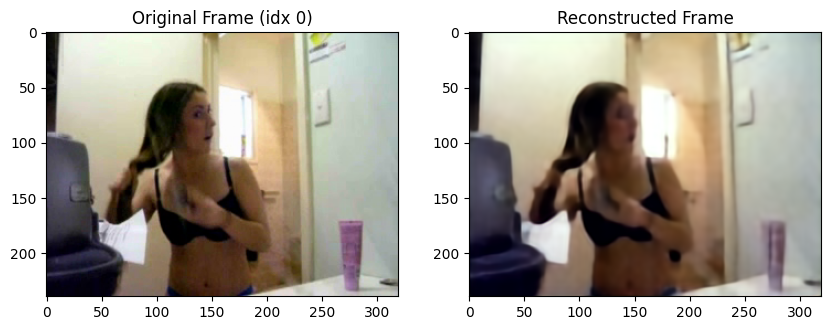

In [7]:

# ========== 5. 读取一张 HMDB 图片 ==========
dataset = HMDBFrame(split='train_near_ood', datapath="/media/volume/HMDB51_video/video")
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

# 取一张图片
batch = next(iter(dataloader))
frame = batch['inputs'].to(device)  # 送入 GPU
frame_idx = batch['frame_idx'].item()
video_file = batch['video_file'][0]

# ========== 6. 送入模型，进行重建 ==========
with torch.no_grad():
    reconstructed_frame, _ = model.model["autoencoder_kl"](sample=frame, sample_posterior=False)

# ========== 7. 显示原图 vs. 复原图 ==========
frame = frame.squeeze().permute(1, 2, 0).cpu().numpy()  # 转为 numpy 格式
reconstructed_frame = reconstructed_frame.squeeze().permute(1, 2, 0).cpu().numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(frame)
ax[0].set_title(f"Original Frame (idx {frame_idx})")
ax[1].imshow(reconstructed_frame)
ax[1].set_title("Reconstructed Frame")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045116827..1.0496993].


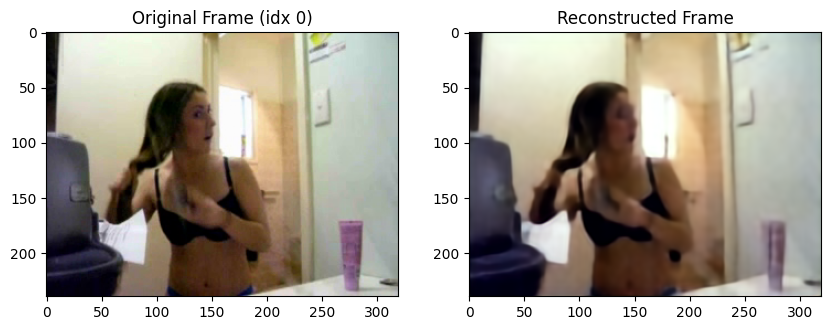

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045060996..1.0499634].


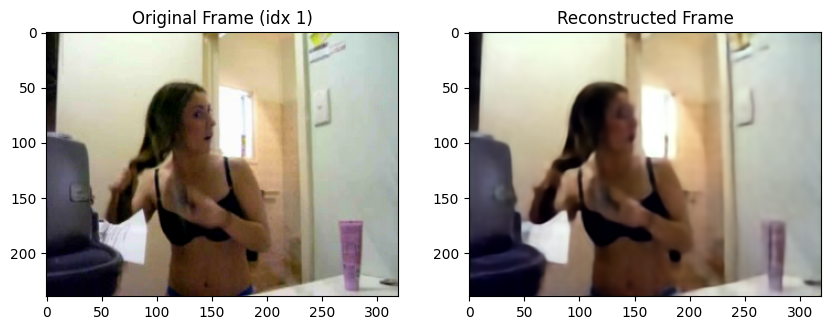

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046226606..1.0472041].


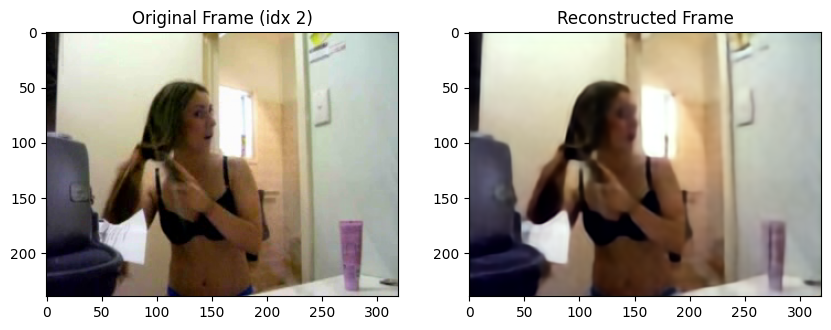

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04650129..1.0476849].


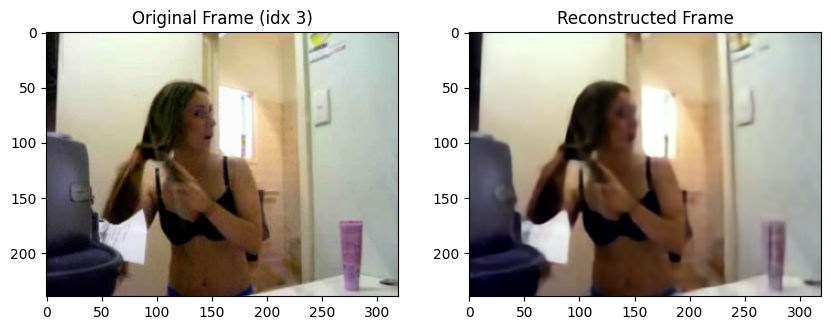

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045254156..1.0475166].


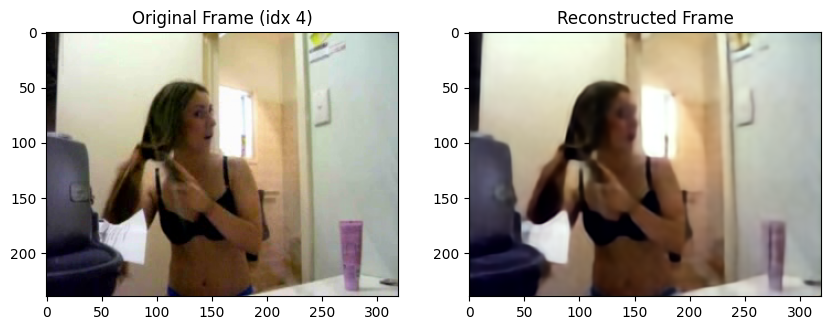

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046351362..1.0465862].


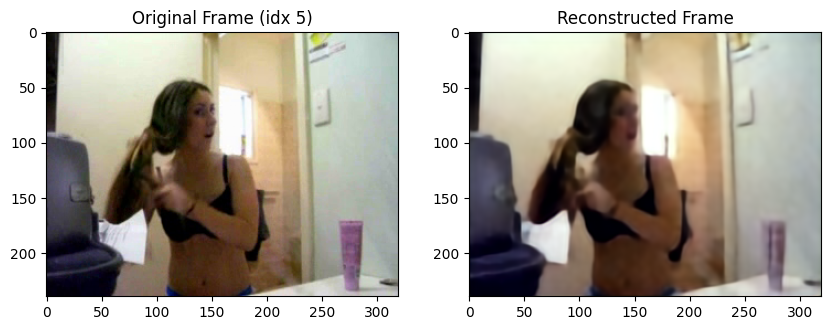

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046331108..1.0466124].


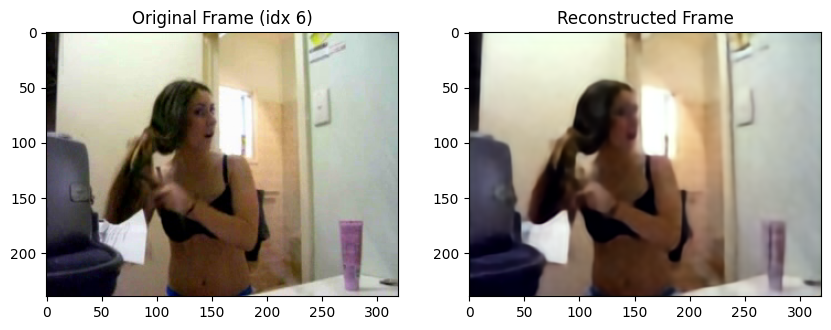

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04779551..1.0477282].


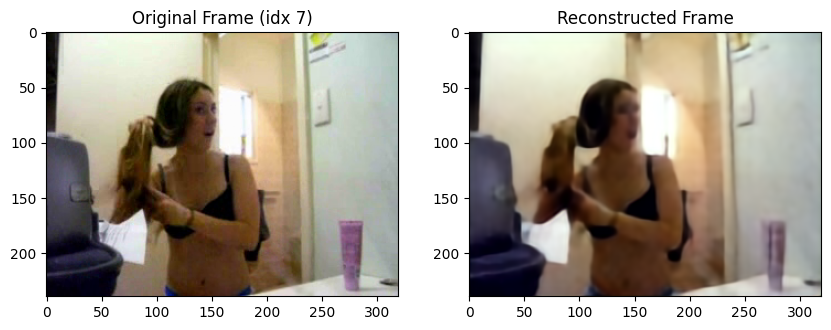

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047299627..1.0474762].


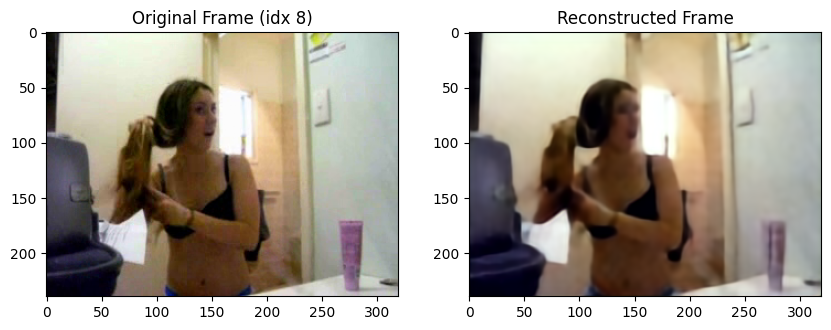

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04288586..1.048661].


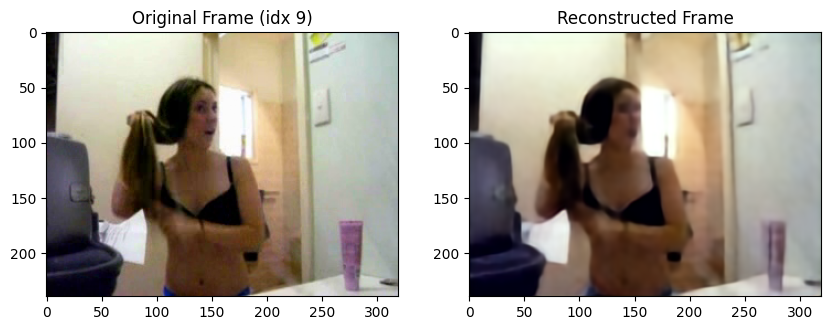

In [8]:
counter = 0
for batch in dataloader:
    if counter >= 10:
        break
    frame = batch['inputs'].to(device)  # 送入 GPU
    frame_idx = batch['frame_idx'].item()
    video_file = batch['video_file'][0]

    # ========== 6. 送入模型，进行重建 ==========
    with torch.no_grad():
        reconstructed_frame, _ = model.model["autoencoder_kl"](sample=frame, sample_posterior=False)

    # ========== 7. 显示原图 vs. 复原图 ==========
    frame = frame.squeeze().permute(1, 2, 0).cpu().numpy()  # 转为 numpy 格式
    reconstructed_frame = reconstructed_frame.squeeze().permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(frame)
    ax[0].set_title(f"Original Frame (idx {frame_idx})")
    ax[1].imshow(reconstructed_frame)
    ax[1].set_title("Reconstructed Frame")
    plt.show()
    
    counter+=1

## 换成24以后的

In [12]:
OODdataset = HMDBFrame(split='eval_near_ood', datapath="/media/volume/HMDB51_video/video")
OODdataloader = DataLoader(OODdataset, batch_size=1, shuffle=False)

Total frames in dataset: 360794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026757233..1.0939255].


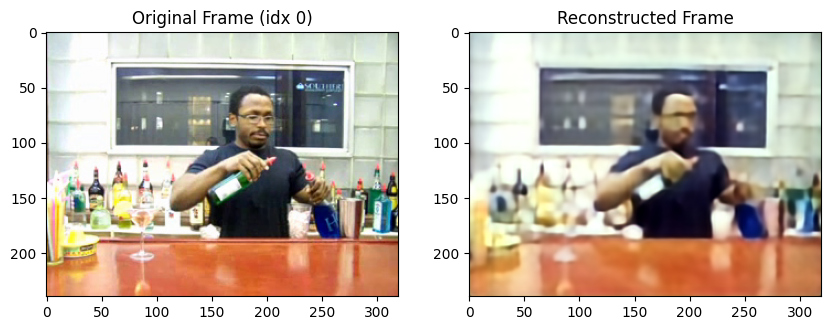

In [13]:
# 取一张图片
batch = next(iter(OODdataloader))
frame = batch['inputs'].to(device)  # 送入 GPU
frame_idx = batch['frame_idx'].item()
video_file = batch['video_file'][0]

# ========== 6. 送入模型，进行重建 ==========
with torch.no_grad():
    reconstructed_frame, _ = model.model["autoencoder_kl"](sample=frame, sample_posterior=False)

# ========== 7. 显示原图 vs. 复原图 ==========
frame = frame.squeeze().permute(1, 2, 0).cpu().numpy()  # 转为 numpy 格式
reconstructed_frame = reconstructed_frame.squeeze().permute(1, 2, 0).cpu().numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(frame)
ax[0].set_title(f"Original Frame (idx {frame_idx})")
ax[1].imshow(reconstructed_frame)
ax[1].set_title("Reconstructed Frame")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026757233..1.0939255].


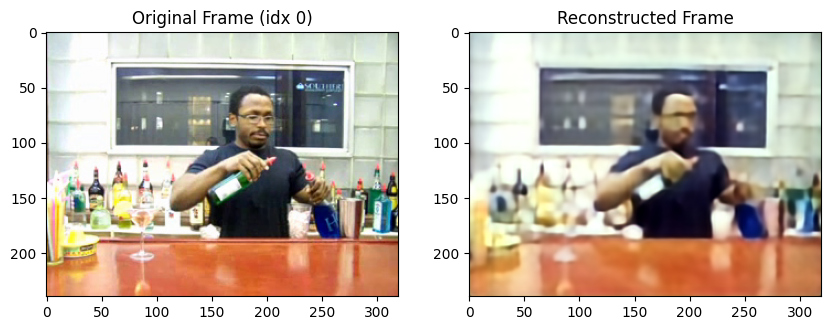

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026757233..1.0939255].


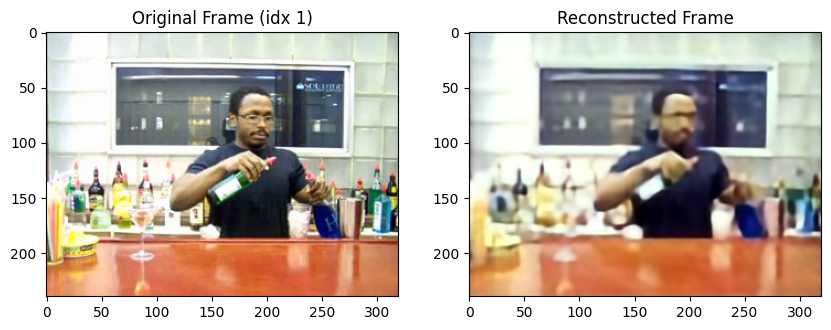

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026757233..1.0939255].


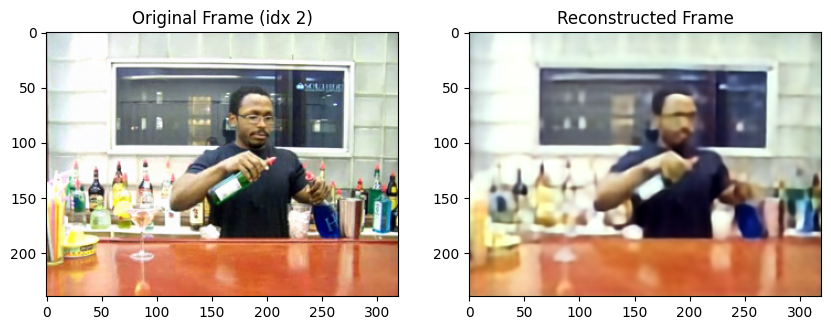

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026757233..1.0939255].


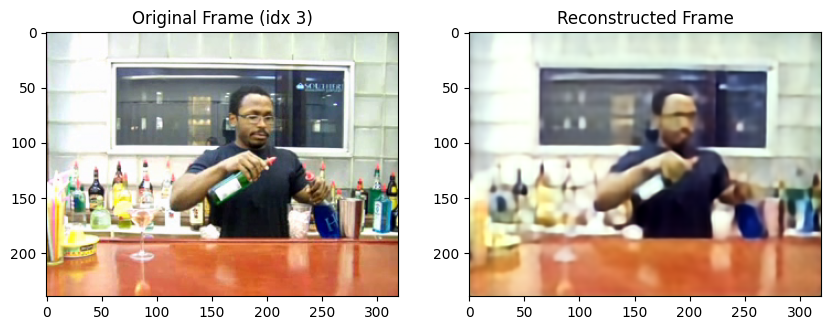

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025681593..1.0934308].


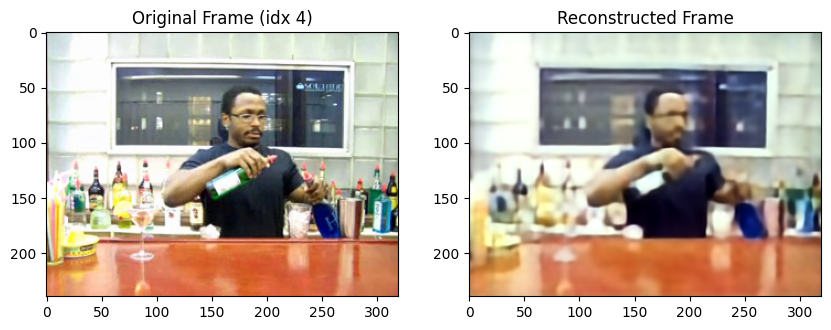

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025504204..1.0949955].


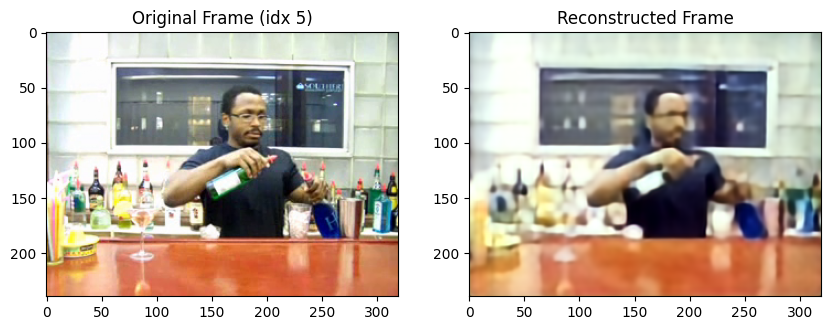

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0256414..1.0949115].


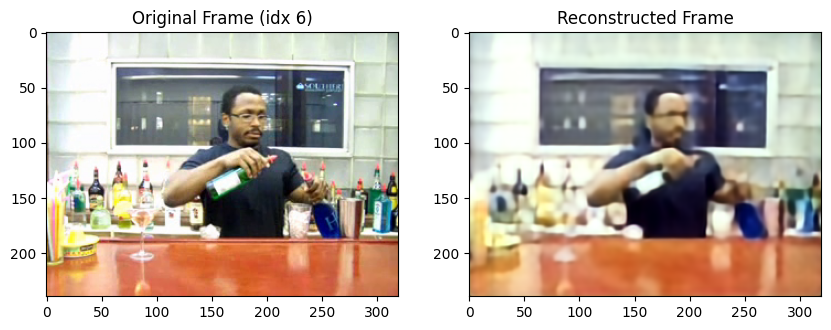

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026609123..1.0988162].


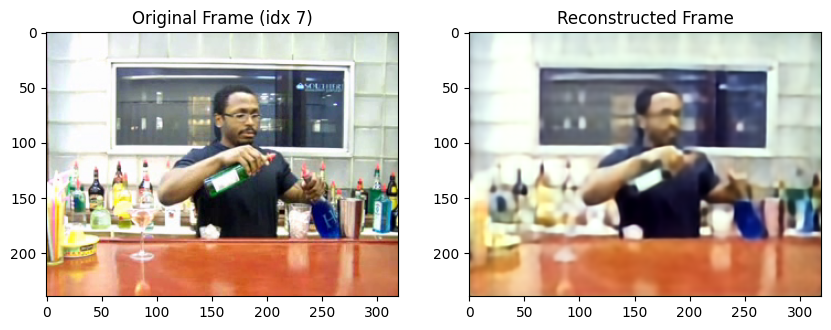

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026627786..1.0989674].


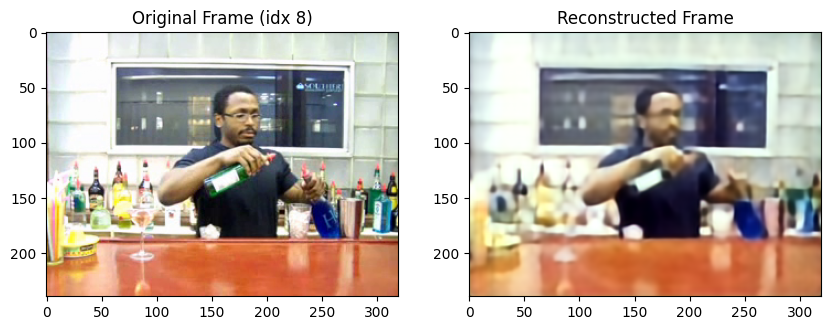

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026616704..1.0993155].


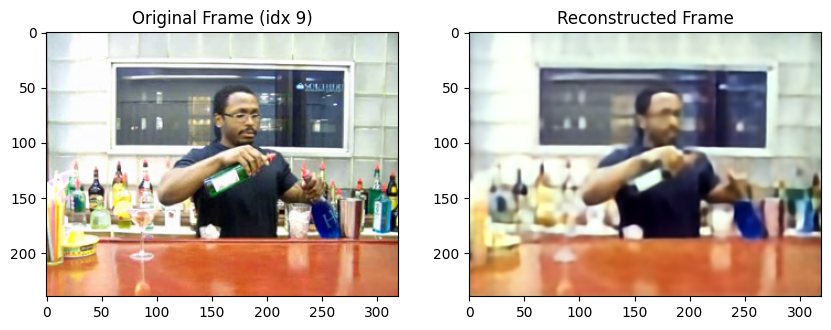

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06037564..1.0917447].


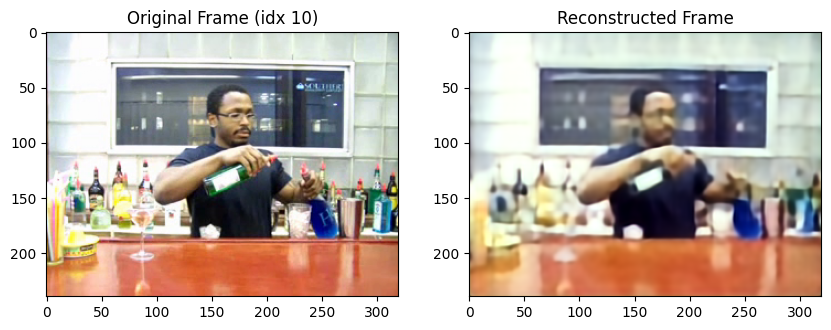

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060243443..1.0922397].


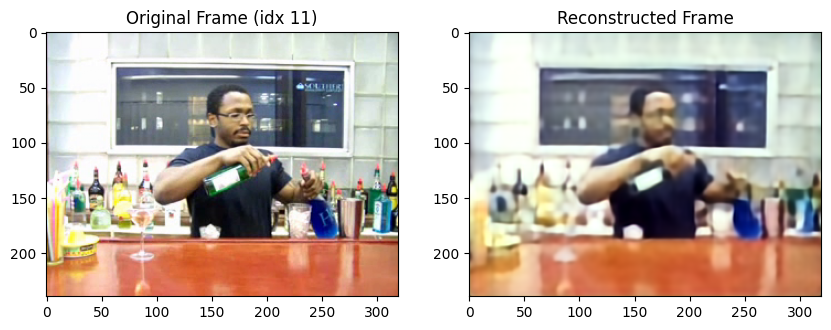

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05444945..1.0961349].


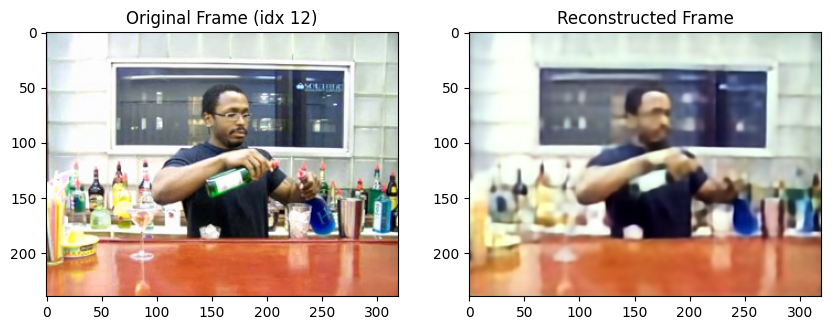

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05436307..1.0966247].


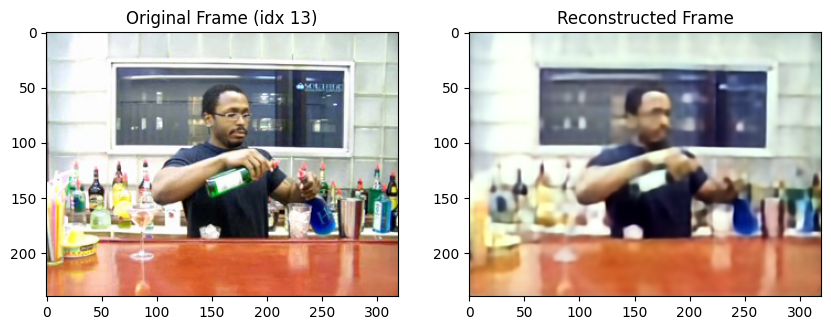

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055136744..1.0973365].


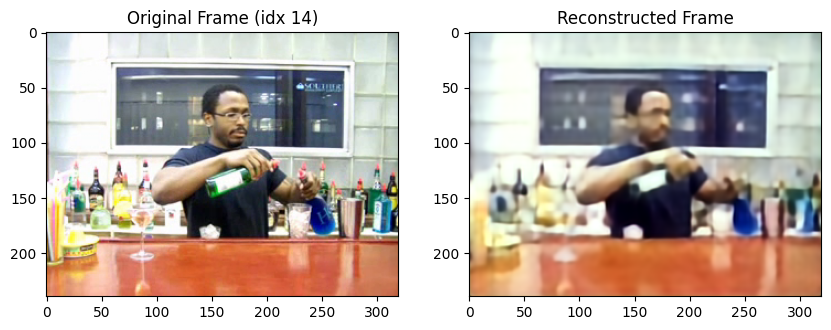

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04568895..1.0966573].


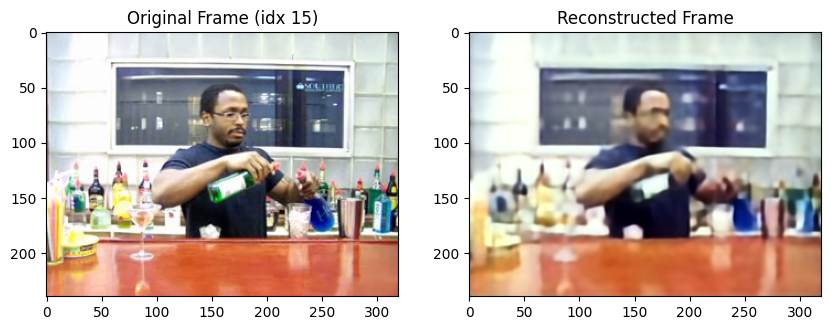

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045728866..1.0945028].


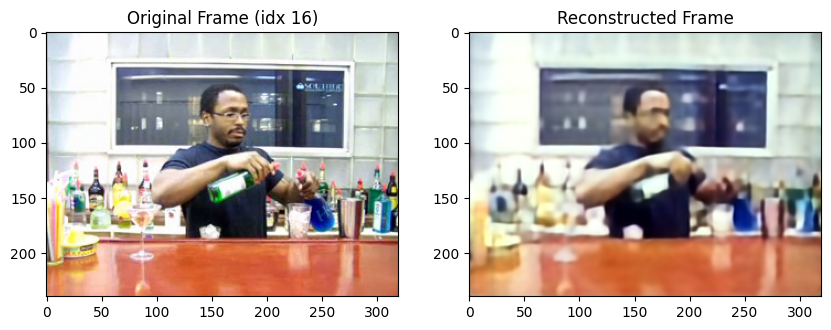

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047684938..1.0979643].


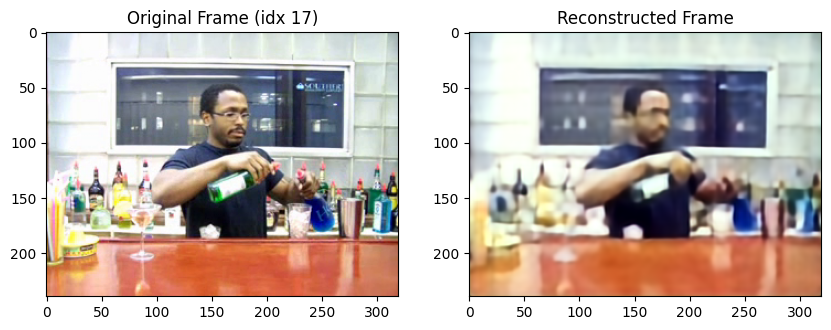

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04549289..1.0906377].


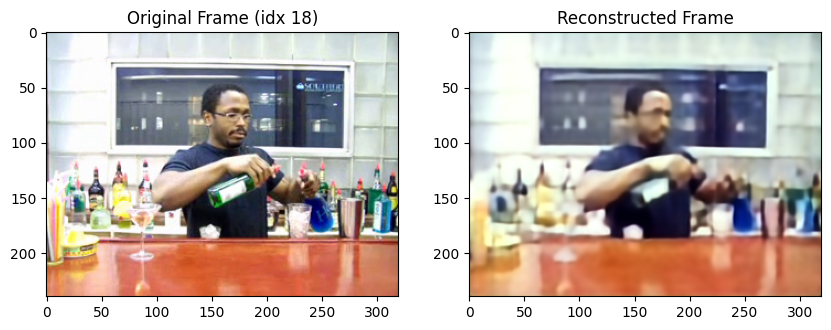

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04536645..1.0908885].


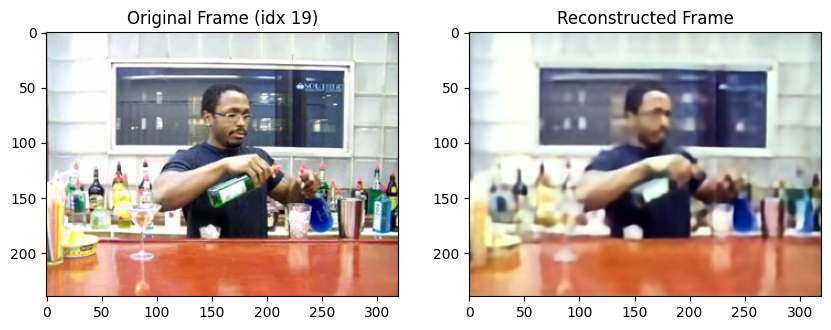

In [15]:
counter = 0
for batch in OODdataloader:
    if counter >= 20:
        break
    frame = batch['inputs'].to(device)  # 送入 GPU
    frame_idx = batch['frame_idx'].item()
    video_file = batch['video_file'][0]

    # ========== 6. 送入模型，进行重建 ==========
    with torch.no_grad():
        reconstructed_frame, _ = model.model["autoencoder_kl"](sample=frame, sample_posterior=False)

    # ========== 7. 显示原图 vs. 复原图 ==========
    frame = frame.squeeze().permute(1, 2, 0).cpu().numpy()  # 转为 numpy 格式
    reconstructed_frame = reconstructed_frame.squeeze().permute(1, 2, 0).cpu().numpy()

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(frame)
    ax[0].set_title(f"Original Frame (idx {frame_idx})")
    ax[1].imshow(reconstructed_frame)
    ax[1].set_title("Reconstructed Frame")
    plt.show()
    
    counter+=1